In [1]:
pip install catboost --q


Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install lightgbm --q

Note: you may need to restart the kernel to use updated packages.


In [148]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split

from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.model_selection import TimeSeriesSplit

from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor, Pool
import lightgbm as lgb


import plotly.graph_objects as go

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor, Pool
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from sklearn.dummy import DummyRegressor
import lightgbm as lgb
import time
warnings.filterwarnings('ignore')

In [5]:
pip install xlrd

In [6]:
df = pd.read_excel('C:/Users/User/Desktop/Дата сайнс 2024/Матрица продаж 01.07-31.12.2023.xls', index_col='Дата продажи')
df_1 = pd.read_excel('C:/Users/User/Desktop/Дата сайнс 2024/Матрица продаж 01.01-30.06.2023.xls', index_col='Дата продажи')

df_2 = pd.read_excel('C:/Users/User/Desktop/Дата сайнс 2024/Матрица продаж 01.07-31.12.2022.xls', index_col='Дата продажи')
df_3 = pd.read_excel('C:/Users/User/Desktop/Дата сайнс 2024/Матрица продаж 01.01-30.06.2022.xls', index_col='Дата продажи')
df_4 = pd.read_excel('C:/Users/User/Desktop/Дата сайнс 2024/Матрица продаж 01.07-31.12.2021.xls', index_col='Дата продажи')
df_5 = pd.read_excel('C:/Users/User/Desktop/Дата сайнс 2024/Матрица продаж 01.01-30.06.2021.xls', index_col='Дата продажи')

In [7]:
# df = pd.read_excel('C:/Users/User/Desktop/Матрица продаж 01.07-31.12.2023.xls')

# df_1 = pd.read_excel('C:/Users/User/Desktop/Матрица продаж 01.01-30.06.2023.xls')

In [8]:
df = pd.concat([df, df_1, df_2, df_3, df_4, df_5])

In [9]:
df.head(5)

,Аптека,Код товара,Наименование товара,Группа,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
Дата продажи,,,,,,,,,,,,
2023-11-19 12:56:37.287,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000206837,"5 дней средство от пота и запаха ног №10 1,5г",NaN,1/1 Упаковка,20,210.696,2023-06-16,Протек,300.0,1,300.0
2023-07-03 17:41:28.550,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000206837,"5 дней средство от пота и запаха ног №10 1,5г",NaN,1/1 Упаковка,20,210.696,2023-06-16,Протек,300.0,1,300.0
2023-12-17 16:11:21.840,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",227184,"5d средство от пота и запаха стоп elite 1,5 n10",NaN,1/1 Упаковка,20,77.868,2023-11-20,Протек,140.0,1,140.0
2023-10-13 19:13:04.107,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",227184,"5d средство от пота и запаха стоп elite 1,5 n10",NaN,1/1 Упаковка,20,77.256,2023-05-12,Пульс,140.0,1,140.0
2023-12-28 14:33:49.230,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",226855,"5-гидрокситриптофан (5-htp) 100 мг капс. 0,25г...",Регистрация упакованной воды в ГИС МТ(TrueAPI),1/1 Упаковка,20,1143.420,2023-02-09,катрен,1350.0,1,1350.0


In [10]:
# df.set_index('Дата продажи', drop=False, inplace=True)

In [11]:
df = df.sort_index()
print(df.index.is_monotonic_increasing)

True


In [12]:
df.head(5)

,Аптека,Код товара,Наименование товара,Группа,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
Дата продажи,,,,,,,,,,,,
2021-01-01 11:50:02.047,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",3000000190358,Капотен 25мг №28 таб.,NaN,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0
2021-01-01 11:51:30.247,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,NaN,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0
2021-01-01 11:51:30.247,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000208018,"Снуп 0,1% 15мл спрей назал",NaN,1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0
2021-01-01 11:51:30.247,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000215638,Эргоферон таб. д/рассасывания х20,NaN,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0
2021-01-01 12:02:10.410,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",190509,Андипал n10 табл,NaN,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0


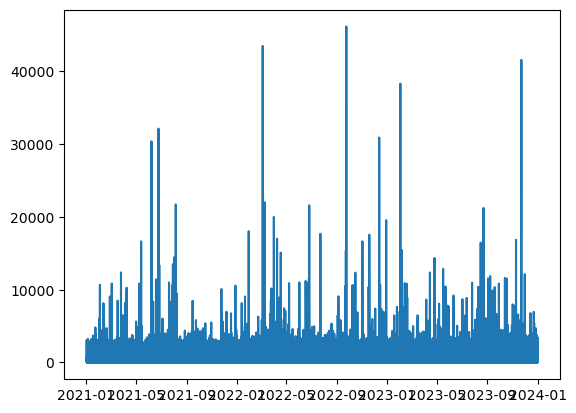

In [13]:
plt.plot(df.index, df['Сумма продано'])

In [14]:
df.head(10)

,Аптека,Код товара,Наименование товара,Группа,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
Дата продажи,,,,,,,,,,,,
2021-01-01 11:50:02.047,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",3000000190358,Капотен 25мг №28 таб.,NaN,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0
2021-01-01 11:51:30.247,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,NaN,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0
2021-01-01 11:51:30.247,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000208018,"Снуп 0,1% 15мл спрей назал",NaN,1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0
2021-01-01 11:51:30.247,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000215638,Эргоферон таб. д/рассасывания х20,NaN,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0
2021-01-01 12:02:10.410,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",190509,Андипал n10 табл,NaN,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0
2021-01-01 12:03:51.387,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",224689,Панангин таб. п/п/о 158мг+140мг бл. №50,NaN,1/1 Упаковка,10,136.3340,2020-12-24,ГрандКапитал,155.7,1,155.7
2021-01-01 12:03:51.387,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000202757,Пенталгин таб. п/о плен. №24,NaN,1/1 Упаковка,10,175.1090,2020-12-21,ГрандКапитал,207.0,1,207.0
2021-01-01 12:03:51.387,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",3000000189843,Валокордин капли 20мл,NaN,1/1 Упаковка,10,132.0000,2020-12-17,ФармЛайн,153.0,1,153.0
2021-01-01 12:21:14.983,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000210917,Энтеросгель паста д/вн. примен. 225г,NaN,1/1 Упаковка,10,433.2900,2020-12-11,ГрандКапитал,504.0,1,504.0


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 240210 entries, 2021-01-01 11:50:02.047000 to 2023-12-31 18:46:36.650000
Data columns (total 12 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   Аптека                        240210 non-null  object        
 1   Код товара                    240210 non-null  int64         
 2   Наименование товара           240210 non-null  object        
 3   Группа                        1165 non-null    object        
 4   Ед. изм.                      240210 non-null  object        
 5   Ставка НДС(%)                 240210 non-null  int64         
 6   Цена зак. с НДС (%)           240210 non-null  float64       
 7   Дата прихода                  240040 non-null  datetime64[ns]
 8   Поставщик                     240210 non-null  object        
 9   Цена роз. с НДС (со скидкой)  240170 non-null  float64       
 10  Кол-во продано                24

In [16]:
df.describe()

,Код товара,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
count,2.402100e+05,240210.000000,240210.000000,240040,240170.000000,240210.000000,240210.000000
mean,5.329547e+11,10.830565,232.019836,2022-06-12 23:53:55.487691520,286.338266,1.344332,310.566317
min,1.888410e+05,0.000000,0.011000,2016-02-25 21:07:40,1.000000,1.000000,1.000000
25%,2.237300e+05,10.000000,39.930000,2021-09-28 00:00:00,56.050000,1.000000,75.585000
50%,2.387900e+05,10.000000,126.340500,2022-06-18 00:00:00,160.000000,1.000000,180.000000
75%,1.000000e+12,10.000000,305.019000,2023-02-28 00:00:00,380.000000,1.000000,400.000000
max,3.000000e+12,20.000000,18781.466000,2023-12-30 00:00:00,20790.000000,200.000000,46170.000000
std,7.200904e+11,2.987424,363.210557,NaN,417.712228,1.540205,506.060081


In [17]:
df[df['Цена роз. с НДС (со скидкой)'].isna()]

,Аптека,Код товара,Наименование товара,Группа,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
Дата продажи,,,,,,,,,,,,
2023-11-05 14:19:22.870,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000213526,Энтеросгель паста (сладкая) для приема внутрь ...,NaN,1/1 Упаковка,10,409.305,2023-11-04,катрен,NaN,1,430.00
2023-11-05 14:19:22.870,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000207698,"Супрастинекс 0,005 n14 табл п/о",NaN,1/1 Упаковка,10,374.055,2023-11-04,катрен,NaN,1,393.00
2023-11-05 14:28:25.383,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",240949,Номидес пор. д/приг. сусп. д/пр.вн. 12мг/мл фл...,NaN,1/1 Упаковка,10,592.999,2023-11-04,катрен,NaN,1,600.00
2023-11-05 14:28:25.383,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",227206,Номидес капс 75 мг х10 ^,NaN,1/1 Упаковка,10,681.868,2023-11-04,катрен,NaN,1,716.00
2023-11-05 14:28:25.383,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",227206,Номидес капс 75 мг х10 ^,NaN,1/1 Упаковка,10,681.868,2023-11-04,катрен,NaN,1,716.00
2023-11-22 16:31:22.927,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",190092,"Ромашки цветки 1,5 n20 ф/пак",NaN,1/1 Упаковка,10,70.367,2023-11-22,катрен,NaN,1,78.30
2023-11-22 16:31:22.927,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",1000000218709,Спазмалгон n10 табл,NaN,1/1 Упаковка,10,144.749,2023-11-22,катрен,NaN,1,157.47
2023-11-22 16:31:22.927,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",3000000190151,До и после крем-гель анти-акне д/проблем кожи ...,NaN,1/1 Упаковка,20,105.300,2023-11-22,катрен,NaN,1,115.70
2023-11-22 16:31:22.927,"ООО ""Фармед"", МО, г.Химки, ул.Академика Грушин...",227228,Лоперамид-акрихин капс 2 мг х10,NaN,1/1 Упаковка,10,40.909,2023-11-22,катрен,NaN,1,46.98


In [18]:
df['Цена роз. с НДС (со скидкой)'] = df['Цена роз. с НДС (со скидкой)'].fillna(df['Сумма продано'] / df['Кол-во продано'])

In [19]:
df[df['Цена роз. с НДС (со скидкой)'].isna()]

,Аптека,Код товара,Наименование товара,Группа,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
Дата продажи,,,,,,,,,,,,


In [20]:
df = df.drop(['Аптека', 'Группа'], axis=1)

In [21]:
df.head(3)

,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
Дата продажи,,,,,,,,,,
2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.340,2020-12-15,ПрофитМед,195.0,1,195.0
2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.496,2020-12-30,ГрандКапитал,230.0,1,230.0
2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.350,2020-12-21,ПрофитМед,123.0,1,123.0


In [22]:
df[df['Ставка НДС(%)'] == 20]

,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано
Дата продажи,,,,,,,,,,
2021-01-01 12:23:32.107,2000000190990,Протефикс крем экстра-сильный 40мл,1/1 Упаковка,20,213.960,2020-11-26,ГрандКапитал,290.0,1,290.0
2021-01-01 15:34:38.667,1000000202907,Синяк-офф гель туба 30г,1/1 Упаковка,20,102.408,2020-12-01,Протек,140.0,1,140.0
2021-01-01 16:12:29.253,2000000191396,Тепловит (аппликатор парафиново-озекеритовый),1/1 Упаковка,20,96.000,NaT,Красногорск перелив,121.0,1,121.0
2021-01-01 17:28:54.557,225074,Витамин ф99 крем полужирный 50мл/туба/,1/1 Упаковка,20,100.800,2020-12-19,катрен,135.0,1,135.0
2021-01-01 17:34:41.143,225010,Ля рош-позе тоник успокаивающий для кожи лица ...,1/1 Упаковка,20,1449.672,2020-12-30,Протек,1510.0,1,1510.0
...,...,...,...,...,...,...,...,...,...,...
2023-12-31 13:02:19.070,2000000192293,Тампоны o.b.прокомфорт супер х16..,1/1 Упаковка,20,259.992,2023-12-04,ФармЛайн,430.0,1,430.0
2023-12-31 13:23:46.943,1000000205312,Максилак n10 капс,1/1 Упаковка,20,521.340,2023-12-27,Протек,666.0,1,666.0
2023-12-31 14:48:26.487,241652,Линкас плющ и солодка пастилки (без сахара) №18,1/1 Упаковка,20,158.448,2023-12-20,ГрандКапитал,237.5,1,237.5


In [23]:
df['Поставщик'].value_counts()

Поставщик
катрен                                                   64038
Протек                                                   57040
Пульс                                                    33925
ГрандКапитал                                             32765
ФармЛайн                                                 25415
ПрофитМед                                                16018
Надежда Фарм                                             10017
Красногорск перелив                                        309
ООО "ПроАптека"                                            174
Русминводы ООО                                             140
ООО "Фармед", МО, г.Химки, ул.Академика Грушина, д. 4      115
КомплектСервис                                             102
ООО "Фармин" г.Москва, Большая Очаковская д. 42к1           89
Ввод остатков                                               46
перелив                                                     16
Катрен не использовать                       

In [24]:
df['Ед. изм.'].value_counts()

Ед. изм.
1/1 Упаковка                233258
1/30 Первичная упаковка       1906
1/100 Первичная упаковка      1300
1/50 Первичная упаковка        913
1/25 Первичная упаковка        746
1/28 Первичная упаковка        612
1/4 Первичная упаковка         495
1/10 Первичная упаковка        376
1/20 Первичная упаковка        250
1/5 Первичная упаковка         115
1/12 Первичная упаковка         71
1/14 Первичная упаковка         38
1/1 штука                       29
1/9 Первичная упаковка          24
1/15 Первичная упаковка         22
1/16 Первичная упаковка         14
1/45 Первичная упаковка         14
1/3 Первичная упаковка          12
1/120 Первичная упаковка         8
1/1 Первичная упаковка           5
1/2 Первичная упаковка           2
Name: count, dtype: int64

In [25]:
df['Наименование товара'].value_counts().head(5)

Наименование товара
Снуп спрей назальный дозированный 90 мкг/доза фл. 150 доз 15мл    1115
Тизин классик спрей наз.дозир. 0,1% флакон 10 мл                  1093
Нимесил гран. пригот. сусп. д/вн. приема 100мг пак. 2г №30        1072
Парацетамол табл 500 мг х20 *                                      921
Нафтизин 0,1% 15мл флак/кап капли                                  862
Name: count, dtype: int64

In [26]:
df['Категория НДС'] = df['Ставка НДС(%)'].apply(lambda x: 'Бады' if x == 20 else ('Лекарства' if x == 10 else 'Мед. Техника'))

In [27]:
df.head(3)

,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС
Дата продажи,,,,,,,,,,,
2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.340,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства
2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.496,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства
2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.350,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства


In [28]:
df.reset_index(inplace=True)
df

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС
0,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства
1,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства
2,2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства
3,2021-01-01 11:51:30.247,1000000215638,Эргоферон таб. д/рассасывания х20,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0,Лекарства
4,2021-01-01 12:02:10.410,190509,Андипал n10 табл,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0,Лекарства
...,...,...,...,...,...,...,...,...,...,...,...,...
240205,2023-12-31 18:18:36.623,1000000201185,Шприц однораз. стерильн 3-х комп. 5 мл. х1,1/1 Упаковка,10,7.6000,2023-12-18,ФармЛайн,18.0,1,18.0,Лекарства
240206,2023-12-31 18:32:55.170,1000000205751,Cosmopor e-послеоперац. самоклеящ. повязка (ст...,1/50 Первичная упаковка,10,9.8571,2023-11-24,ГрандКапитал,27.0,2,54.0,Лекарства
240207,2023-12-31 18:32:55.170,241792,Виферон супп рект 500000 ме №10,1/1 Упаковка,10,437.6020,2023-12-28,Надежда Фарм,493.2,1,493.2,Лекарства
240208,2023-12-31 18:35:09.457,227690,Фемибион 1 n28 табл п/плен/оболоч по 917мг,1/1 Упаковка,20,947.7600,2023-12-18,Надежда Фарм,1215.0,1,1215.0,Бады


In [29]:
df['День продажи'] = df['Дата продажи'].dt.day_name()

In [30]:
df['Месяц продажи'] = df['Дата продажи'].dt.month_name()

In [31]:
df['Год продажи'] = df['Дата продажи'].dt.year

In [32]:
df['Дата продажи без времени'] = df['Дата продажи'].dt.date

In [33]:
df['Год и месяц продажи'] = df['Дата продажи'].dt.strftime('%Y-%m')

In [34]:
#df['datetame']= data['datetame'].dt.round('1h')

In [35]:
m = df.set_index('Дата продажи', drop=False)
m

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
Дата продажи,,,,,,,,,,,,,,,,,
2021-01-01 11:50:02.047,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2021-01-01 11:51:30.247,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2021-01-01 11:51:30.247,2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2021-01-01 11:51:30.247,2021-01-01 11:51:30.247,1000000215638,Эргоферон таб. д/рассасывания х20,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2021-01-01 12:02:10.410,2021-01-01 12:02:10.410,190509,Андипал n10 табл,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 18:18:36.623,2023-12-31 18:18:36.623,1000000201185,Шприц однораз. стерильн 3-х комп. 5 мл. х1,1/1 Упаковка,10,7.6000,2023-12-18,ФармЛайн,18.0,1,18.0,Лекарства,Sunday,December,2023,2023-12-31,2023-12
2023-12-31 18:32:55.170,2023-12-31 18:32:55.170,1000000205751,Cosmopor e-послеоперац. самоклеящ. повязка (ст...,1/50 Первичная упаковка,10,9.8571,2023-11-24,ГрандКапитал,27.0,2,54.0,Лекарства,Sunday,December,2023,2023-12-31,2023-12
2023-12-31 18:32:55.170,2023-12-31 18:32:55.170,241792,Виферон супп рект 500000 ме №10,1/1 Упаковка,10,437.6020,2023-12-28,Надежда Фарм,493.2,1,493.2,Лекарства,Sunday,December,2023,2023-12-31,2023-12


In [36]:
i = df.groupby('Дата продажи без времени')['Сумма продано'].agg(['mean', 'sum', 'count']).reset_index()
i

,Дата продажи без времени,mean,sum,count
0,2021-01-01,332.722222,35934.00,108
1,2021-01-02,253.349202,41295.92,163
2,2021-01-03,222.521429,40498.90,182
3,2021-01-04,252.663429,44216.10,175
4,2021-01-05,292.020000,54023.70,185
...,...,...,...,...
1090,2023-12-27,433.451926,105762.27,244
1091,2023-12-28,384.470629,109958.60,286
1092,2023-12-29,404.467198,137114.38,339
1093,2023-12-30,350.484153,105495.73,301


In [37]:
i.describe()

,mean,sum,count
count,1095.000000,1095.000000,1095.000000
mean,309.138591,68128.890329,219.369863
std,53.332601,18804.945088,42.751025
min,189.841351,16464.100000,74.000000
25%,270.104444,54920.460000,193.000000
50%,303.204310,65915.900000,216.000000
75%,340.587972,79952.740000,243.000000
max,558.251322,141449.450000,385.000000


In [38]:
df_for_group = df.reset_index(drop=True)
df_for_group

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
0,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
1,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2,2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
3,2021-01-01 11:51:30.247,1000000215638,Эргоферон таб. д/рассасывания х20,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
4,2021-01-01 12:02:10.410,190509,Андипал n10 табл,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240205,2023-12-31 18:18:36.623,1000000201185,Шприц однораз. стерильн 3-х комп. 5 мл. х1,1/1 Упаковка,10,7.6000,2023-12-18,ФармЛайн,18.0,1,18.0,Лекарства,Sunday,December,2023,2023-12-31,2023-12
240206,2023-12-31 18:32:55.170,1000000205751,Cosmopor e-послеоперац. самоклеящ. повязка (ст...,1/50 Первичная упаковка,10,9.8571,2023-11-24,ГрандКапитал,27.0,2,54.0,Лекарства,Sunday,December,2023,2023-12-31,2023-12
240207,2023-12-31 18:32:55.170,241792,Виферон супп рект 500000 ме №10,1/1 Упаковка,10,437.6020,2023-12-28,Надежда Фарм,493.2,1,493.2,Лекарства,Sunday,December,2023,2023-12-31,2023-12
240208,2023-12-31 18:35:09.457,227690,Фемибион 1 n28 табл п/плен/оболоч по 917мг,1/1 Упаковка,20,947.7600,2023-12-18,Надежда Фарм,1215.0,1,1215.0,Бады,Sunday,December,2023,2023-12-31,2023-12


In [39]:
a = df_for_group.groupby('Дата продажи')['Код товара'].count().reset_index()
a['Код товара'].value_counts()

Код товара
1     95235
2     32088
3     11790
4      4871
5      2141
6       984
7       479
8       250
9       163
10       68
11       48
12       31
13       14
14       13
15       10
16        6
17        4
20        3
19        2
18        2
21        2
23        1
29        1
30        1
Name: count, dtype: int64

In [40]:
fig = px.histogram(i,
                  x = 'sum',
                  marginal = 'box',
                  opacity = 0.5,
                  barmode = 'group',
                  title = 'Распределение суммы покупки')
fig.show()

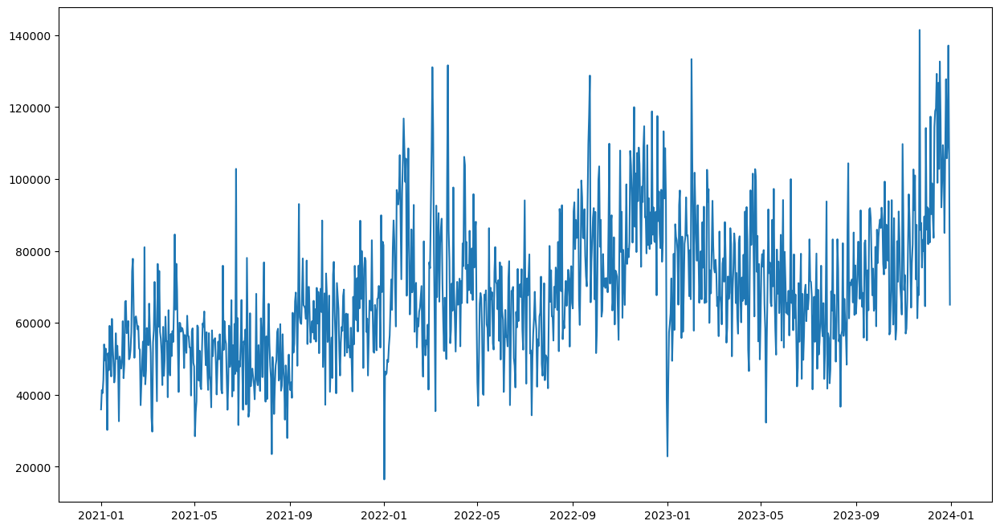

In [41]:
plt.figure(figsize= (15, 8))
plt.plot(i['Дата продажи без времени'], i['sum'])
plt.show()

In [42]:
df.head(3)

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
0,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.340,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
1,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.496,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2,2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.350,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01


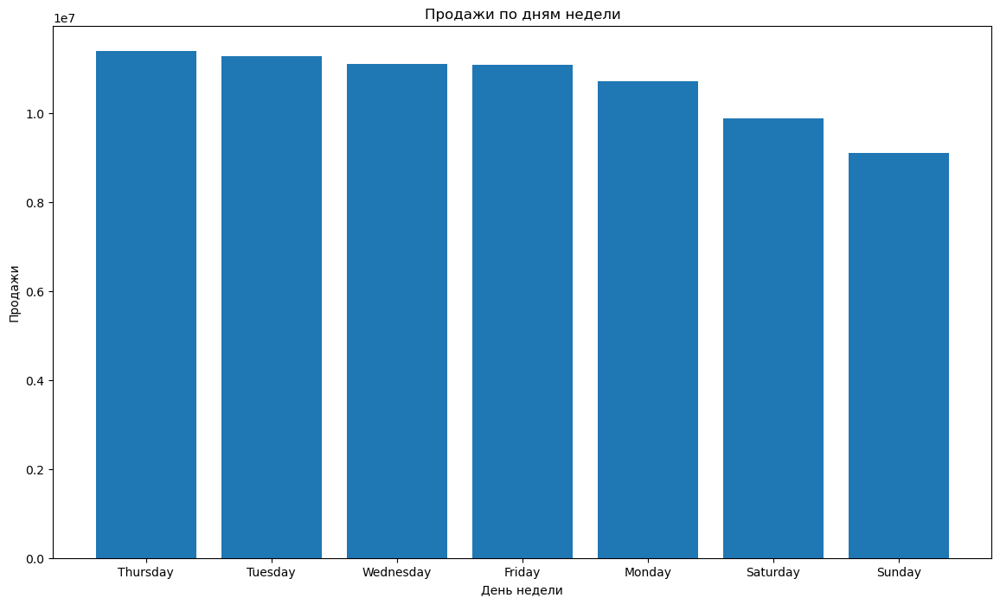

In [43]:
plt.figure(figsize=(14, 8))
plt.bar(df.groupby('День продажи')['Сумма продано'].sum().sort_values(ascending=False).index, df.groupby('День продажи')['Сумма продано'].sum().sort_values(ascending=False))
plt.title('Продажи по дням недели')
plt.xlabel('День недели')
plt.ylabel('Продажи')
# plt.legend()
plt.show()

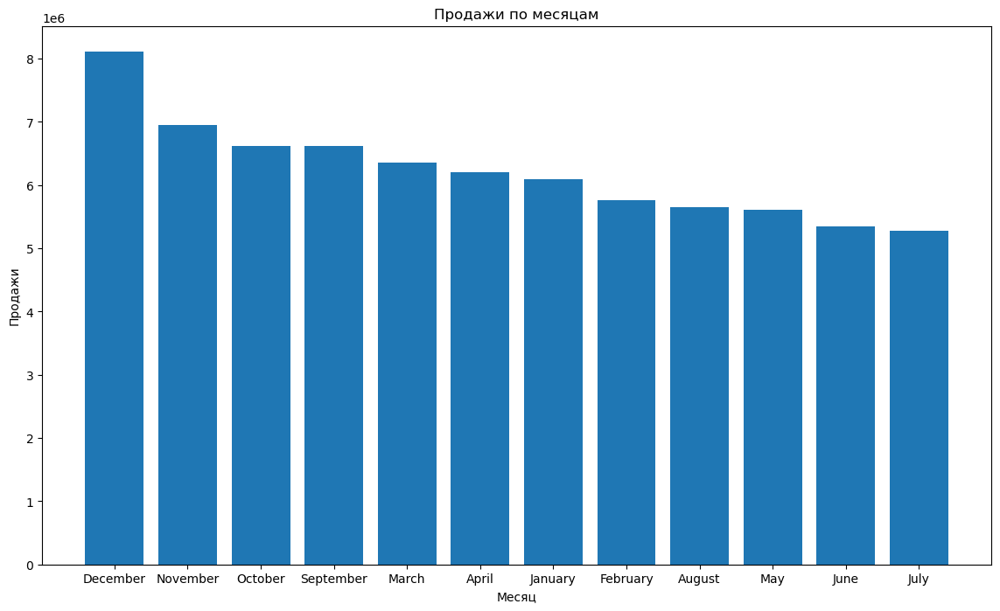

In [44]:
plt.figure(figsize=(14, 8))
plt.bar(df.groupby('Месяц продажи')['Сумма продано'].sum().sort_values(ascending=False).index, df.groupby('Месяц продажи')['Сумма продано'].sum().sort_values(ascending=False))
plt.title('Продажи по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Продажи')
# plt.legend()
plt.show()

In [45]:
df.head()

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
0,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
1,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2,2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
3,2021-01-01 11:51:30.247,1000000215638,Эргоферон таб. д/рассасывания х20,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
4,2021-01-01 12:02:10.410,190509,Андипал n10 табл,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0,Лекарства,Friday,January,2021,2021-01-01,2021-01


In [46]:
df_new = m['Сумма продано']

In [47]:
df_new

Дата продажи
2021-01-01 11:50:02.047     195.0
2021-01-01 11:51:30.247     230.0
2021-01-01 11:51:30.247     123.0
2021-01-01 11:51:30.247     470.0
2021-01-01 12:02:10.410      15.0
                            ...  
2023-12-31 18:18:36.623      18.0
2023-12-31 18:32:55.170      54.0
2023-12-31 18:32:55.170     493.2
2023-12-31 18:35:09.457    1215.0
2023-12-31 18:46:36.650     169.0
Name: Сумма продано, Length: 240210, dtype: float64

<Axes: xlabel='Дата продажи'>

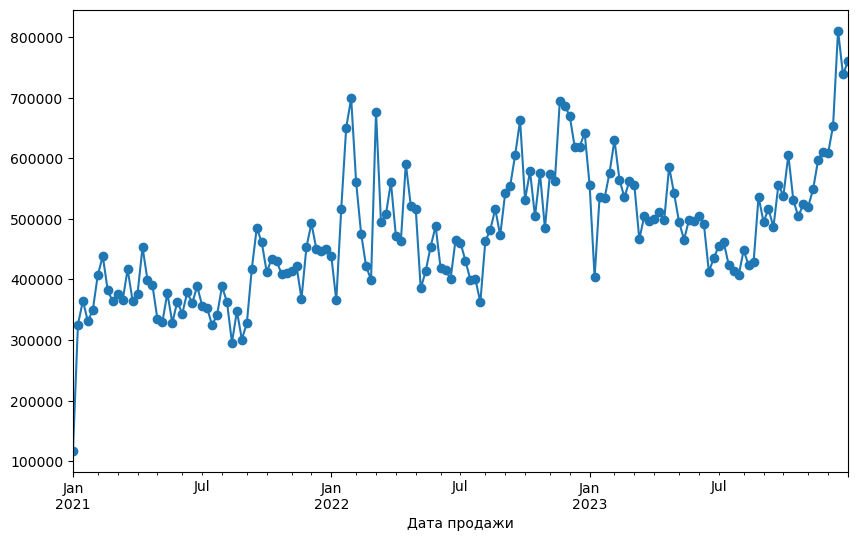

In [107]:
data = df_new.resample('1W').sum()
data.plot(figsize=(10, 6), marker='o')

In [49]:
df.head(2)

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
0,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.340,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
1,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.496,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01


In [50]:
# df.groupby()

In [51]:
o = df.groupby('Год продажи')['Сумма продано'].agg(['mean','count']).reset_index()
o

,Год продажи,mean,count
0,2021,267.409171,75390
1,2022,313.934368,86059
2,2023,348.196185,78761


In [52]:
o['prim'] = o['mean'] * o['count']
o

,Год продажи,mean,count,prim
0,2021,267.409171,75390,20159977.38
1,2022,313.934368,86059,27016877.79
2,2023,348.196185,78761,27424279.74


In [53]:
df[df['Наименование товара'] == 'Снуп спрей назальный дозированный 90 мкг/доза фл. 150 доз 15мл']\
        .groupby('Год и месяц продажи')['Цена роз. с НДС (со скидкой)'].mean()


Год и месяц продажи
2021-01    119.053846
2021-02    116.630303
2021-03    113.791525
2021-04    116.516176
2021-05    118.307143
2021-06    116.309091
2021-07    112.703125
2021-08    115.014286
2021-09    121.817647
2021-10    122.940625
2021-11    121.117647
2021-12    119.943939
2022-01    117.999432
2022-02    122.670755
2022-03    128.983846
2022-04    125.658571
2022-05    125.757377
2022-06    123.182143
2022-07    124.419048
2022-08    124.769444
2022-11    125.186364
2023-02    130.188462
2023-03    129.757143
2023-04    130.322222
2023-05    131.100000
2023-06    124.792222
2023-07    126.036250
2023-08    125.875581
2023-09    129.360000
Name: Цена роз. с НДС (со скидкой), dtype: float64

In [54]:
data.name = 'Сумма'
# data.columns = ['Сумма']
# data = data.rename(columns={'': 'Сумма'})
data

Дата продажи
2021-01-31    1488993.24
2021-02-28    1591676.07
2021-03-31    1679203.58
2021-04-30    1720723.51
2021-05-31    1523997.08
2021-06-30    1575309.84
2021-07-31    1573742.44
2021-08-31    1443427.47
2021-09-30    1827249.45
2021-10-31    1862965.80
2021-11-30    1797499.83
2021-12-31    2075189.07
2022-01-31    2380044.01
2022-02-28    1848248.07
2022-03-31    2452137.07
2022-04-30    2229014.31
2022-05-31    1911462.53
2022-06-30    1832025.95
2022-07-31    1794206.94
2022-08-31    2147222.66
2022-09-30    2572523.81
2022-10-31    2333062.86
2022-11-30    2702727.09
2022-12-31    2814202.49
2023-01-31    2219270.10
2023-02-28    2319801.52
2023-03-31    2230022.24
2023-04-30    2254237.67
2023-05-31    2179081.01
2023-06-30    1944427.48
2023-07-31    1905081.93
2023-08-31    2056610.17
2023-09-30    2215630.90
2023-10-31    2423282.74
2023-11-30    2454832.08
2023-12-31    3222001.90
Freq: M, Name: Сумма, dtype: float64

In [55]:
data.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 36 entries, 2021-01-31 to 2023-12-31
Freq: M
Series name: Сумма
Non-Null Count  Dtype  
--------------  -----  
36 non-null     float64
dtypes: float64(1)
memory usage: 576.0 bytes


In [56]:
m.head(1)

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
Дата продажи,,,,,,,,,,,,,,,,,
2021-01-01 11:50:02.047,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.34,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01


In [57]:
m.isna().sum()

Дата продажи                      0
Код товара                        0
Наименование товара               0
Ед. изм.                          0
Ставка НДС(%)                     0
Цена зак. с НДС (%)               0
Дата прихода                    170
Поставщик                         0
Цена роз. с НДС (со скидкой)      0
Кол-во продано                    0
Сумма продано                     0
Категория НДС                     0
День продажи                      0
Месяц продажи                     0
Год продажи                       0
Дата продажи без времени          0
Год и месяц продажи               0
dtype: int64

In [58]:
df = df.dropna()

In [59]:
df.isna().sum()

Дата продажи                    0
Код товара                      0
Наименование товара             0
Ед. изм.                        0
Ставка НДС(%)                   0
Цена зак. с НДС (%)             0
Дата прихода                    0
Поставщик                       0
Цена роз. с НДС (со скидкой)    0
Кол-во продано                  0
Сумма продано                   0
Категория НДС                   0
День продажи                    0
Месяц продажи                   0
Год продажи                     0
Дата продажи без времени        0
Год и месяц продажи             0
dtype: int64

In [60]:
r = m['Сумма продано']

In [61]:
r.isna().sum()

0

In [62]:
r = r.resample('1W').mean()

In [63]:
r.isna().sum()

0

In [64]:
# data['rolling_mean'] = data.rolling(10).mean()
# data.plot(figsize=(10, 6), marker='o')

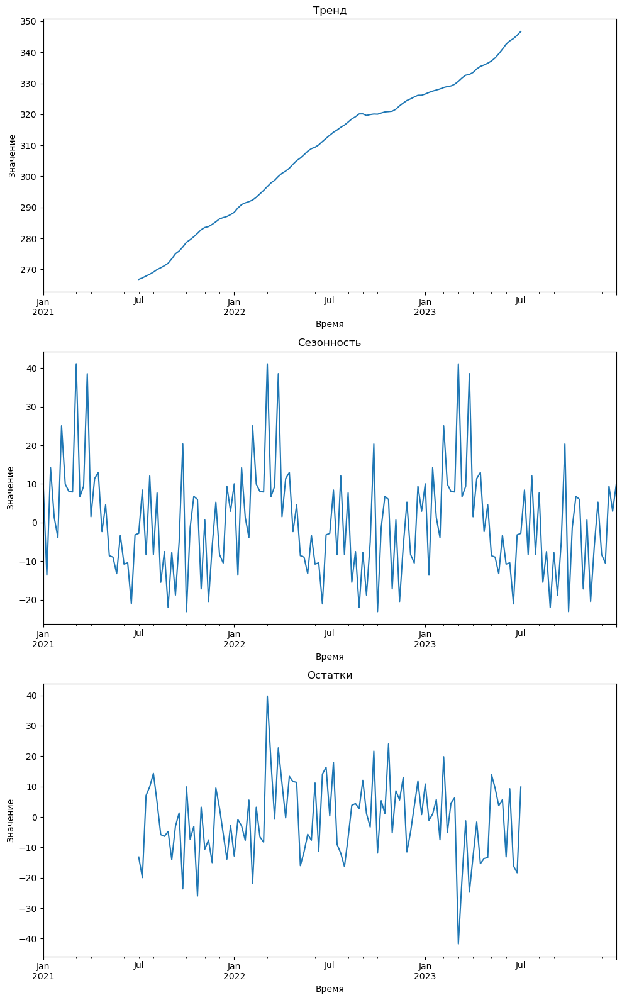

In [65]:
decompose = seasonal_decompose(r)

plt.figure(figsize=(10, 16))
plt.subplot(311)
decompose.trend.plot(ax=plt.gca())
plt.title('Тренд')
plt.xlabel('Время')
plt.ylabel('Значение')


plt.subplot(312)
decompose.seasonal.plot(ax=plt.gca())
plt.title('Сезонность')
plt.xlabel('Время')
plt.ylabel('Значение')

plt.subplot(313)
decompose.resid.plot(ax=plt.gca())
plt.title('Остатки')
plt.xlabel('Время')
plt.ylabel('Значение')


plt.tight_layout()
plt.show()

In [66]:
df.head()

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
0,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
1,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2,2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
3,2021-01-01 11:51:30.247,1000000215638,Эргоферон таб. д/рассасывания х20,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
4,2021-01-01 12:02:10.410,190509,Андипал n10 табл,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0,Лекарства,Friday,January,2021,2021-01-01,2021-01


In [67]:
df['Наименование товара'].unique()

array(['Капотен 25мг №28 таб.',
       'Терафлю от гриппа и простуды пор. пригот. р-ра д/вн. приема пор. №4 (лимон)',
       'Снуп 0,1% 15мл спрей назал', ...,
       'Благомин витамин с (аскорбиновая кислота 300мг) n90 капс по 0,4г',
       'Бициллин-5 1500000ед флак пор д/сусп в/м',
       'Виферон супп рект 500000 ме №10'], dtype=object)

In [68]:
k = df[df['Наименование товара'].str.contains('Снуп', case=False) == True]

In [69]:
k['Наименование товара'].value_counts()

Наименование товара
Снуп спрей назальный дозированный 90 мкг/доза фл. 150 доз 15мл    1115
Снуп спрей наз. фл. 0,1% 15мл №1                                   335
Снуп спрей назальный 0.05% фл. 15мл                                230
Снуп спрей наз. доз. 90мкг/доза фл. 15мл (150 доз)                 157
Снуп спрей наз. доз 90мкг/доза 0,1% 15 мл фл №1 *(м)               132
Снуп 0,1% 15мл спрей назал                                          56
Снуп спрей назальн. 0.1 % фл.пласт. распыл. 15 мл х1                41
Снуп спрей 0,1% фл 15мл                                             17
Снуп экстра спр. наз. дозир. 84мкг/доза+70мкг/доза фл. 10мл         11
Снуп спрей наз. доз. 45мкг/доза фл. 15мл (150 доз)                  11
Снуп 0,05% 15мл спрей назал                                         10
Снуп 45мкг/доза 150доз (15мл) спрей назал доз                        4
Name: count, dtype: int64

In [70]:
def replace(df):
    df.loc[df['Наименование товара'].str.contains('90|0.1%|0.1 %'), 'Наименование товара']\
    = 'Снуп спрей назальный дозированный 90 мкг/доза фл. 150 доз 15мл'
    df.loc[df['Наименование товара'].str.contains('45|0.05%'), 'Наименование товара']\
    = 'Снуп спрей назальный дозированный 45 мкг/доза фл. 150 доз 15мл'

In [71]:
replace(k)

In [72]:
k['Наименование товара'].value_counts()

Наименование товара
Снуп спрей назальный дозированный 90 мкг/доза фл. 150 доз 15мл    1853
Снуп спрей назальный дозированный 45 мкг/доза фл. 150 доз 15мл     255
Снуп экстра спр. наз. дозир. 84мкг/доза+70мкг/доза фл. 10мл         11
Name: count, dtype: int64

In [73]:
snyp = k[k['Наименование товара'] == 'Снуп спрей назальный дозированный 90 мкг/доза фл. 150 доз 15мл']
snyp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1853 entries, 2 to 240160
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Дата продажи                  1853 non-null   datetime64[ns]
 1   Код товара                    1853 non-null   int64         
 2   Наименование товара           1853 non-null   object        
 3   Ед. изм.                      1853 non-null   object        
 4   Ставка НДС(%)                 1853 non-null   int64         
 5   Цена зак. с НДС (%)           1853 non-null   float64       
 6   Дата прихода                  1853 non-null   datetime64[ns]
 7   Поставщик                     1853 non-null   object        
 8   Цена роз. с НДС (со скидкой)  1853 non-null   float64       
 9   Кол-во продано                1853 non-null   int64         
 10  Сумма продано                 1853 non-null   float64       
 11  Категория НДС                 185

In [74]:
snyp.head()

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
2,2021-01-01 11:51:30.247,1000000208018,Снуп спрей назальный дозированный 90 мкг/доза ...,1/1 Упаковка,10,97.35,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
31,2021-01-01 13:22:32.627,1000000208018,Снуп спрей назальный дозированный 90 мкг/доза ...,1/1 Упаковка,10,97.35,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
69,2021-01-01 16:41:09.367,1000000208018,Снуп спрей назальный дозированный 90 мкг/доза ...,1/1 Упаковка,10,97.35,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
201,2021-01-02 16:02:29.377,1000000208018,Снуп спрей назальный дозированный 90 мкг/доза ...,1/1 Упаковка,10,97.35,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Saturday,January,2021,2021-01-02,2021-01
217,2021-01-02 16:31:24.830,1000000208018,Снуп спрей назальный дозированный 90 мкг/доза ...,1/1 Упаковка,10,97.35,2020-12-21,ПрофитМед,110.7,1,110.7,Лекарства,Saturday,January,2021,2021-01-02,2021-01


In [75]:
snyp.index.is_monotonic_increasing

True

In [76]:
snyp.groupby('Год и месяц продажи')['Кол-во продано'].sum()

Год и месяц продажи
2021-01     67
2021-02     92
2021-03     78
2021-04     54
2021-05     55
2021-06     46
2021-07     45
2021-08     50
2021-09     77
2021-10     74
2021-11     72
2021-12     90
2022-01    129
2022-02     98
2022-03    122
2022-04     85
2022-05     83
2022-06     39
2022-07     36
2022-08     89
2022-09     65
2022-10     50
2022-11     30
2022-12     20
2023-01     50
2023-02     70
2023-03     80
2023-04     93
2023-05     49
2023-06     65
2023-07     62
2023-08     70
2023-09     30
2023-10     70
2023-11     90
2023-12     73
Name: Кол-во продано, dtype: int64

In [77]:
pivot_snyp = pd.pivot_table(snyp, values='Кол-во продано', index='Год и месяц продажи', aggfunc='sum').reset_index()

In [78]:
pivot_snyp.set_index('Год и месяц продажи', inplace=True)

In [79]:
pivot_snyp

,Кол-во продано
Год и месяц продажи,
2021-01,67
2021-02,92
2021-03,78
2021-04,54
2021-05,55
2021-06,46
2021-07,45
2021-08,50
2021-09,77


In [80]:
pivot_snyp.index = pd.to_datetime(pivot_snyp.index)

In [81]:
def make_features(df, max_lag, rolling_mean_size):
    

    df['year'] = df.index.year
    df['month'] = df.index.month
    
    for lag in range(1, max_lag + 1):
        df['lag_{}'.format(lag)] = df['Кол-во продано'].shift(lag)

    df['rolling_mean'] = df['Кол-во продано'].shift().rolling(rolling_mean_size).mean()

In [82]:
make_features(pivot_snyp, 1, 1)

In [83]:
pivot_snyp

,Кол-во продано,year,month,lag_1,rolling_mean
Год и месяц продажи,,,,,
2021-01-01,67,2021,1,NaN,NaN
2021-02-01,92,2021,2,67.0,67.0
2021-03-01,78,2021,3,92.0,92.0
2021-04-01,54,2021,4,78.0,78.0
2021-05-01,55,2021,5,54.0,54.0
2021-06-01,46,2021,6,55.0,55.0
2021-07-01,45,2021,7,46.0,46.0
2021-08-01,50,2021,8,45.0,45.0
2021-09-01,77,2021,9,50.0,50.0


In [105]:
pivot_snyp['Кол-во продано'].mean()

68.0

In [84]:
pivot_snyp.shape

(36, 5)

In [85]:
train, test = train_test_split(pivot_snyp, shuffle=False, test_size=0.2, random_state=1234)
train = train.dropna()

In [86]:
train.shape

(27, 5)

In [87]:
test.shape

(8, 5)

In [88]:
features_train = train.drop('Кол-во продано', axis=1)
target_train = train['Кол-во продано']
features_test = test.drop('Кол-во продано', axis=1)
target_test = test['Кол-во продано']

In [89]:
splits = TimeSeriesSplit(n_splits=3)

In [90]:
scorer = make_scorer(mean_squared_error, squared=False)

In [91]:
RF = RandomForestRegressor(random_state=42)
parametrs = {"max_depth": range(1,10), "n_estimators":[100,150,10,200]}

RF_grid = GridSearchCV(RF, parametrs, cv=splits, scoring=scorer, verbose=True, n_jobs=-1)

In [92]:
RF_grid.fit(features_train, target_train)

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=None),
             estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': range(1, 10),
                         'n_estimators': [100, 150, 10, 200]},
             scoring=make_scorer(mean_squared_error, squared=False),
             verbose=True)

In [93]:
RF_grid.best_score_

38.52189846593162

In [98]:
param_dist = {"max_depth": [10, 20, 30, 40, 50],
              "num_leaves": [10, 20, 30, 40],
              "learning_rate": [0.01, 0.05, 0.1, 0.2],
              "n_estimators": range(100, 1000),
              "boosting_type": ['dart', 'rf']}

model_lgb = lgb.LGBMRegressor(metric='l1')

random_search_lgb = RandomizedSearchCV(model_lgb, param_distributions=param_dist, n_iter=10, scoring='neg_root_mean_squared_error')

random_search_lgb.fit(features_train, target_train)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 21, number of used features: 0
[LightGBM] [Info] Start training from score 71.523810
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

RandomizedSearchCV(estimator=LGBMRegressor(metric='l1'),
                   param_distributions={'boosting_type': ['dart', 'rf'],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'max_depth': [10, 20, 30, 40, 50],
                                        'n_estimators': range(100, 1000),
                                        'num_leaves': [10, 20, 30, 40]},
                   scoring='neg_root_mean_squared_error')

In [99]:
random_search_lgb.best_score_

-27.552861273732255

In [96]:
catboost = CatBoostRegressor(loss_function='RMSE',random_state = 42)
parameters_cat = {'depth': range(1,10), 'learning_rate': np.arange(0.1,1,0.2)}
catboost_grid = GridSearchCV(catboost, parameters_cat, cv=splits, verbose=True, scoring='neg_root_mean_squared_error')
catboost_grid.fit(features_train, target_train)

Fitting 3 folds for each of 45 candidates, totalling 135 fits
0:	learn: 15.9654120	total: 141ms	remaining: 2m 20s
1:	learn: 15.5906974	total: 141ms	remaining: 1m 10s
2:	learn: 15.5512494	total: 142ms	remaining: 47.2s
3:	learn: 15.3623269	total: 142ms	remaining: 35.4s
4:	learn: 15.0377667	total: 142ms	remaining: 28.3s
5:	learn: 14.8741562	total: 143ms	remaining: 23.6s
6:	learn: 14.6705323	total: 147ms	remaining: 20.9s
7:	learn: 14.3802780	total: 148ms	remaining: 18.3s
8:	learn: 14.1029721	total: 148ms	remaining: 16.3s
9:	learn: 13.8529545	total: 149ms	remaining: 14.7s
10:	learn: 13.6840322	total: 154ms	remaining: 13.8s
11:	learn: 13.5304173	total: 156ms	remaining: 12.8s
12:	learn: 13.4317961	total: 158ms	remaining: 12s
13:	learn: 13.2738902	total: 158ms	remaining: 11.1s
14:	learn: 13.0729691	total: 158ms	remaining: 10.4s
15:	learn: 12.8925828	total: 159ms	remaining: 9.79s
16:	learn: 12.7696175	total: 160ms	remaining: 9.22s
17:	learn: 12.6355894	total: 160ms	remaining: 8.71s
18:	learn: 1

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=None),
             estimator=<catboost.core.CatBoostRegressor object at 0x00000264F6F55350>,
             param_grid={'depth': range(1, 10),
                         'learning_rate': array([0.1, 0.3, 0.5, 0.7, 0.9])},
             scoring='neg_root_mean_squared_error', verbose=True)

In [97]:
catboost_grid.best_score_

-41.17459154416667

лучшая модель выбрали и предсказываем

In [106]:
predict_test = random_search_lgb.best_estimator_.predict(features_test)
predict_test

array([69.33333333, 69.33333333, 69.33333333, 69.33333333, 69.33333333,
       69.33333333, 69.33333333, 69.33333333])

In [104]:
rmse = mean_squared_error(target_test, predict_test, squared=False)
rmse

17.58747976386737

In [109]:
m.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 240210 entries, 2021-01-01 11:50:02.047000 to 2023-12-31 18:46:36.650000
Data columns (total 17 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   Дата продажи                  240210 non-null  datetime64[ns]
 1   Код товара                    240210 non-null  int64         
 2   Наименование товара           240210 non-null  object        
 3   Ед. изм.                      240210 non-null  object        
 4   Ставка НДС(%)                 240210 non-null  int64         
 5   Цена зак. с НДС (%)           240210 non-null  float64       
 6   Дата прихода                  240040 non-null  datetime64[ns]
 7   Поставщик                     240210 non-null  object        
 8   Цена роз. с НДС (со скидкой)  240210 non-null  float64       
 9   Кол-во продано                240210 non-null  int64         
 10  Сумма продано                 24

In [110]:
m.head(2)

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
Дата продажи,,,,,,,,,,,,,,,,,
2021-01-01 11:50:02.047,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.340,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2021-01-01 11:51:30.247,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.496,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01


In [113]:
df.head(10)

,Дата продажи,Код товара,Наименование товара,Ед. изм.,Ставка НДС(%),Цена зак. с НДС (%),Дата прихода,Поставщик,Цена роз. с НДС (со скидкой),Кол-во продано,Сумма продано,Категория НДС,День продажи,Месяц продажи,Год продажи,Дата продажи без времени,Год и месяц продажи
0,2021-01-01 11:50:02.047,3000000190358,Капотен 25мг №28 таб.,1/1 Упаковка,10,153.3400,2020-12-15,ПрофитМед,195.0,1,195.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
1,2021-01-01 11:51:30.247,1000000204700,Терафлю от гриппа и простуды пор. пригот. р-ра...,1/1 Упаковка,10,177.4960,2020-12-30,ГрандКапитал,230.0,1,230.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
2,2021-01-01 11:51:30.247,1000000208018,"Снуп 0,1% 15мл спрей назал",1/1 Упаковка,10,97.3500,2020-12-21,ПрофитМед,123.0,1,123.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
3,2021-01-01 11:51:30.247,1000000215638,Эргоферон таб. д/рассасывания х20,1/1 Упаковка,10,350.0055,2020-12-24,ФармЛайн,470.0,1,470.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
4,2021-01-01 12:02:10.410,190509,Андипал n10 табл,1/1 Упаковка,10,9.7130,2020-11-18,катрен,15.0,1,15.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
5,2021-01-01 12:03:51.387,224689,Панангин таб. п/п/о 158мг+140мг бл. №50,1/1 Упаковка,10,136.3340,2020-12-24,ГрандКапитал,155.7,1,155.7,Лекарства,Friday,January,2021,2021-01-01,2021-01
6,2021-01-01 12:03:51.387,1000000202757,Пенталгин таб. п/о плен. №24,1/1 Упаковка,10,175.1090,2020-12-21,ГрандКапитал,207.0,1,207.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
7,2021-01-01 12:03:51.387,3000000189843,Валокордин капли 20мл,1/1 Упаковка,10,132.0000,2020-12-17,ФармЛайн,153.0,1,153.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
8,2021-01-01 12:21:14.983,1000000210917,Энтеросгель паста д/вн. примен. 225г,1/1 Упаковка,10,433.2900,2020-12-11,ГрандКапитал,504.0,1,504.0,Лекарства,Friday,January,2021,2021-01-01,2021-01
9,2021-01-01 12:21:14.983,221773,Синупрет таб. п/о №50,1/1 Упаковка,10,427.1520,2020-12-09,Пульс,513.0,1,513.0,Лекарства,Friday,January,2021,2021-01-01,2021-01


In [120]:
check = df.groupby('Дата продажи')['Сумма продано'].sum().reset_index()
check = pd.DataFrame(check)
check

,Дата продажи,Сумма продано
0,2021-01-01 11:50:02.047,195.0
1,2021-01-01 11:51:30.247,823.0
2,2021-01-01 12:02:10.410,15.0
3,2021-01-01 12:03:51.387,515.7
4,2021-01-01 12:21:14.983,1480.5
...,...,...
148109,2023-12-31 18:17:41.687,65.0
148110,2023-12-31 18:18:36.623,18.0
148111,2023-12-31 18:32:55.170,547.2
148112,2023-12-31 18:35:09.457,1215.0


In [125]:
check['Дата продажи'] = check['Дата продажи'].dt.round('1h')
check

,Дата продажи,Сумма продано
0,2021-01-01 12:00:00,195.0
1,2021-01-01 12:00:00,823.0
2,2021-01-01 12:00:00,15.0
3,2021-01-01 12:00:00,515.7
4,2021-01-01 12:00:00,1480.5
...,...,...
148109,2023-12-31 18:00:00,65.0
148110,2023-12-31 18:00:00,18.0
148111,2023-12-31 19:00:00,547.2
148112,2023-12-31 19:00:00,1215.0


In [131]:
count = pd.DataFrame(check.groupby('Дата продажи')['Сумма продано'].count().reset_index())
count

,Дата продажи,Сумма продано
0,2021-01-01 12:00:00,6
1,2021-01-01 13:00:00,14
2,2021-01-01 14:00:00,6
3,2021-01-01 15:00:00,8
4,2021-01-01 16:00:00,8
...,...,...
14100,2023-12-31 15:00:00,15
14101,2023-12-31 16:00:00,12
14102,2023-12-31 17:00:00,8
14103,2023-12-31 18:00:00,7


достаем дату и час

In [141]:
count['День'] = count['Дата продажи'].dt.dayofweek
count['Час'] = count['Дата продажи'].dt.hour

In [147]:
count.head(20)

,Дата продажи,Сумма продано,День,Час
0,2021-01-01 12:00:00,6,4,12
1,2021-01-01 13:00:00,14,4,13
2,2021-01-01 14:00:00,6,4,14
3,2021-01-01 15:00:00,8,4,15
4,2021-01-01 16:00:00,8,4,16
5,2021-01-01 17:00:00,11,4,17
6,2021-01-01 18:00:00,9,4,18
7,2021-01-01 19:00:00,4,4,19
8,2021-01-01 20:00:00,2,4,20
9,2021-01-02 11:00:00,7,5,11


In [143]:
grouped = count.groupby(['День', 'Час'])['Сумма продано'].sum().reset_index()

In [144]:
grouped

,День,Час,Сумма продано
0,0,10,593
1,0,11,1411
2,0,12,1853
3,0,13,1702
4,0,14,1558
...,...,...,...
87,6,18,1731
88,6,19,1667
89,6,20,1602
90,6,21,1247


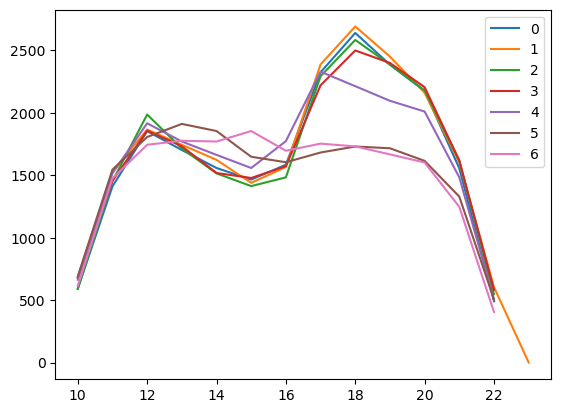

In [146]:
for day in grouped['День'].unique():
    data_day = grouped[grouped['День'] == day]
    plt.plot(data_day['Час'], data_day['Сумма продано'], label=day)
    plt.legend()

In [150]:
fig = go.Figure()

for day in grouped['День'].unique():
    data_day = grouped[grouped['День'] == day]
    fig.add_trace(go.Scatter(x=data_day['Час'], y=data_day['Сумма продано'], mode='lines', name=f'День {day}'))

fig.update_layout(title='Продажи по дням и часам', xaxis_title='Час', yaxis_title='Сумма продано')
fig.show()

<Axes: xlabel='Дата продажи'>

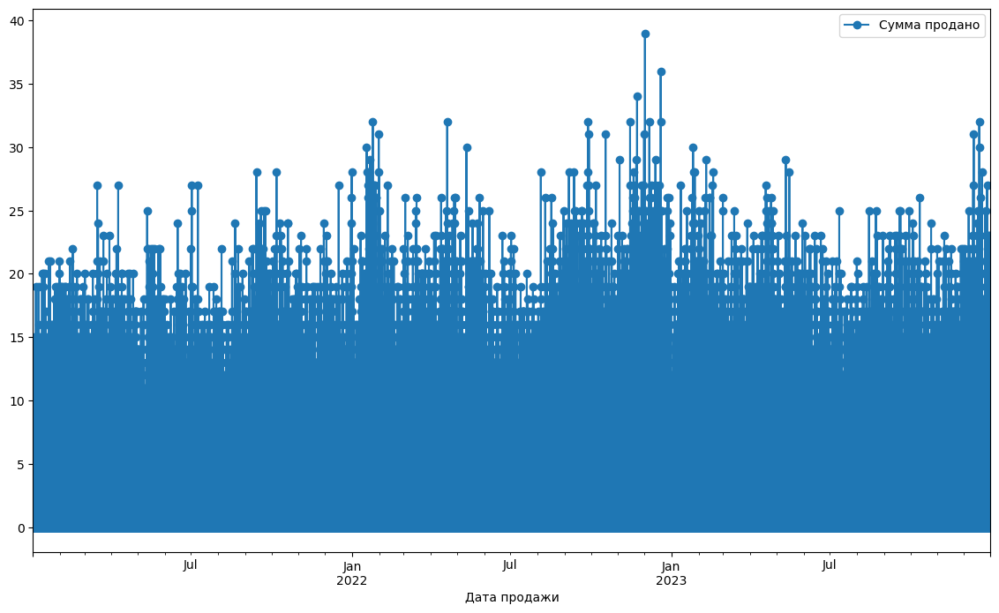

In [119]:
data = check.resample('1H').count()
data.plot(figsize=(14, 8), marker='o')